In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
INPUT = os.path.join("..", "data", "merged_2.csv")
df = pd.read_csv(INPUT)
dependency_names = df.groupby('dependency_name').count().index.tolist()
serializable_cols = ["serializable_cnt", "add_class", "remove_class", "add_serializable", "remove_serializable"
                     , "add_serializable_indirect", "remove_serializable_indirect"]

In [3]:
print(f"Size pre-cleaning: {len(df.index)}")
print(len(df.groupby('dependency_name').count().index))

Size pre-cleaning: 111008
1093


In [4]:
df['serializable_cnt'] = df['serializable_cnt'].str.replace(r'[\s:]', '', regex=True)
df = df[df['serializable_cnt'].notna() & (df['serializable_cnt'] != '')]

print(f"Without NaN values: {len(df.index)}")
print(len(df.groupby('dependency_name').count().index))

Without NaN values: 56968
534


In [5]:
for col in serializable_cols:
    df[col] = pd.to_numeric(df[col])
df = df.loc[df['serializable_cnt'] >= 1]

In [6]:
print(f"Without not containing serializable: {len(df.index)}")
print(f"Without not containing serializable: {len(df.groupby('dependency_name').count().index)}")

Without not containing serializable: 56966
Without not containing serializable: 533


In [7]:
# Export Dataset A:
df_A = df[["dependency_name", "parsed_date", "version", "serializable_cnt", "add_class", "remove_class", "add_serializable", "remove_serializable"
                     , "add_serializable_indirect", "remove_serializable_indirect", "next_version", "download_url"]]

print(df_A)
df_A.to_csv("gadget_providers.csv", index=False)


                                 dependency_name parsed_date version  \
793     androidx.databinding.databinding-runtime   9/24/2018   3.2.0   
794     androidx.databinding.databinding-runtime  10/11/2018   3.2.1   
795     androidx.databinding.databinding-runtime    1/7/2019   3.3.0   
796     androidx.databinding.databinding-runtime    2/6/2019   3.3.1   
797     androidx.databinding.databinding-runtime    3/4/2019   3.3.2   
...                                          ...         ...     ...   
110990                         xerces.xercesImpl   1/27/2022  2.12.2   
110997                         xml-apis.xml-apis  11/19/2005  1.3.02   
110998                         xml-apis.xml-apis   5/12/2006  1.3.03   
110999                         xml-apis.xml-apis  12/22/2006  1.3.04   
111003                         xml-apis.xml-apis  10/31/2013   2.9.1   

        serializable_cnt  add_class  remove_class  add_serializable  \
793                   10        NaN           NaN               

In [8]:
df['parsed_date'] = pd.to_datetime(df['parsed_date'])
dep_recent_release = df[df['parsed_date'].dt.year.isin([2024, 2025])]['dependency_name'].unique()
df = df[df['dependency_name'].isin(dep_recent_release)]

# dataset B
# dataset C

df_B = df[["dependency_name", "parsed_date", "version", "serializable_cnt", "add_class", "remove_class", "add_serializable", "remove_serializable"
                     , "add_serializable_indirect", "remove_serializable_indirect", "next_version", "download_url"]]
df_B.to_csv("gadget_providers_volatile.csv", index=False)

min_date = df['parsed_date'].min()
df['days_since_start'] = (df['parsed_date'] - min_date).dt.days

# df['version_index'] = df.groupby('dependency_name')['version'].transform(lambda x: pd.Categorical(x).codes + 1)
df[['major', 'minor', 'patch', 'fix']] = df['version'].str.split('.', n=3, expand=True)
df[['major', 'minor', 'patch', 'fix']] = df[['major', 'minor', 'patch', 'fix']].fillna(0).astype('int64')
df = df.sort_values(by=['dependency_name', 'major', 'minor', 'patch', 'fix'], ascending=[True, True, True, True, True])
df['version_index'] = df.groupby('dependency_name').cumcount() + 1

correlations_version = df.groupby('dependency_name').apply(lambda x: x['version_index'].corr(x['serializable_cnt'])).dropna()
correlations_year = df.groupby('dependency_name').apply(lambda x: x['days_since_start'].corr(x['serializable_cnt'])).dropna()
print(correlations_year.to_string())

352
dependency_name
biz.aQute.bnd.biz.aQute.bndlib                                0.691544
ch.qos.logback.logback-classic                                0.199692
ch.qos.logback.logback-core                                   0.894952
ch.qos.reload4j.reload4j                                     -0.185635
com.alibaba.druid                                            -0.620624
com.alibaba.fastjson2.fastjson2                               0.568143
com.aliyun.oss.aliyun-sdk-oss                                 0.956814
com.android.tools.common                                      0.846091
com.atlassian.cache.atlassian-cache-api                      -0.172637
com.atlassian.plugins.rest.atlassian-rest-module              0.715851
com.auth0.java-jwt                                           -0.379244
com.azure.azure-core                                          0.516974
com.chuusai.shapeless                                        -0.595083
com.clickhouse.clickhouse-jdbc                           

C:\Users\brunok\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\brunok\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\brunok\AppData\Local\Temp\ipykernel_1144\904757290.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlations_version = df.groupby('dependency_name').apply(lambda x: x['version_index'].corr(x['

In [10]:
total_cnt = len(df.groupby('dependency_name').count())
print(total_cnt)

print("by version correlations:\n--------------------------")
print(correlations_version[correlations_version <= -0.5].count() / total_cnt)
print(correlations_version[correlations_version > -0.5][correlations_version < 0].count() / total_cnt)
print(correlations_version[correlations_version >= 0][correlations_version < 0.5].count() / total_cnt)
print(correlations_version[correlations_version >= 0.5].count() / total_cnt)

print("\nby year correlations:\n--------------------------")
print(correlations_year[correlations_year <= -0.5].count() / total_cnt)
print(correlations_year[correlations_year > -0.5][correlations_year < 0].count() / total_cnt)
print(correlations_year[correlations_year >= 0][correlations_year < 0.5].count() / total_cnt)
print(correlations_year[correlations_year >= 0.5].count() / total_cnt)

352
by version correlations:
--------------------------
0.11079545454545454
0.09659090909090909
0.07954545454545454
0.5170454545454546

by year correlations:
--------------------------
0.10511363636363637
0.11079545454545454
0.09375
0.4943181818181818


In [13]:
variance = df.groupby('dependency_name')['serializable_cnt'].std()
mask = df["dependency_name"].isin(variance[variance > 0].index)

# dataset C
volatile_dependencies = df[mask]

df_C = volatile_dependencies[["dependency_name", "parsed_date", "version", "serializable_cnt", "add_class", "remove_class", "add_serializable", "remove_serializable"
                     , "add_serializable_indirect", "remove_serializable_indirect", "next_version", "download_url"]]

print(df_C.groupby("dependency_name").count())
df_C.to_csv("gadget_providers_volatile.csv", index=False)



                                parsed_date  version  serializable_cnt  \
dependency_name                                                          
biz.aQute.bnd.biz.aQute.bndlib           32       32                32   
ch.qos.logback.logback-classic          127      127               127   
ch.qos.logback.logback-core              48       48                48   
ch.qos.reload4j.reload4j                 14       14                14   
com.alibaba.druid                       111      111               111   
...                                     ...      ...               ...   
software.amazon.awssdk.kinesis         3394     3394              3394   
software.amazon.awssdk.kms             3390     3390              3390   
software.amazon.awssdk.lambda          3379     3379              3379   
software.amazon.awssdk.s3              3394     3394              3394   
software.amazon.awssdk.sqs             3393     3393              3393   

                                add_c

In [11]:
dependencies_with_change_events = 0
change_events_dict = {}


for dependency in df['dependency_name'].unique():
    df_by_name = df[df['dependency_name'] == dependency]
    change_event_cnt = 0
    
    for col in serializable_cols:
        if col == "serializable_cnt": continue

        change_event_cnt += df_by_name[col].sum()
        
        if df_by_name[col].sum() > 0:
            has_change_events = True  
            if not col in change_events_dict:
                change_events_dict[col] = 0
            change_events_dict[col] += 1       
    

print(change_events_dict)

total_change_events = 0

for col in serializable_cols:
    if col == "serializable_cnt": continue
    total_change_events += df[col].sum()
    
print(total_change_events) 
for col in serializable_cols:
    if col == "serializable_cnt": continue
    print(f"{col} : {df[col].sum()} : {df[col].sum() / total_change_events}")
    

{'add_class': 275, 'remove_class': 237, 'add_serializable': 190, 'remove_serializable': 109, 'remove_serializable_indirect': 74, 'add_serializable_indirect': 108}
242919.0
add_class : 124424.0 : 0.5122036563628205
remove_class : 86497.0 : 0.35607342365150524
add_serializable : 14640.0 : 0.06026700258110728
remove_serializable : 6367.0 : 0.026210382884829922
add_serializable_indirect : 8090.0 : 0.03330328216401352
remove_serializable_indirect : 2901.0 : 0.011942252355723514


In [12]:
# All with add/remove serializable
dependencies_with_serializable_change = []

for dependency in df['dependency_name'].unique():
    df_by_name = df[df['dependency_name'] == dependency]
    change_event_cnt = 0
    
    for col in ["add_serializable", "remove_serializable" , "add_serializable_indirect", "remove_serializable_indirect"]:
        if df_by_name[col].sum() > 0:
            dependencies_with_serializable_change.append(dependency)
            break

print(len(dependencies_with_serializable_change))


mask = df["dependency_name"].isin(dependencies_with_serializable_change)
# dataset C
volatile_dependencies = df[mask]
df_D = volatile_dependencies[["dependency_name", "parsed_date", "version", "serializable_cnt", "add_class", "remove_class", "add_serializable", "remove_serializable"
                     , "add_serializable_indirect", "remove_serializable_indirect", "next_version", "download_url"]]
df_D.to_csv("gadget_providers_volatile_stealthy.csv", index=False)


208


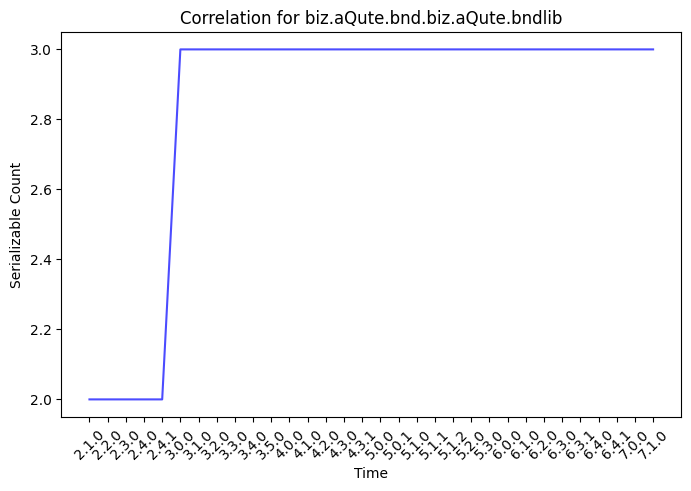

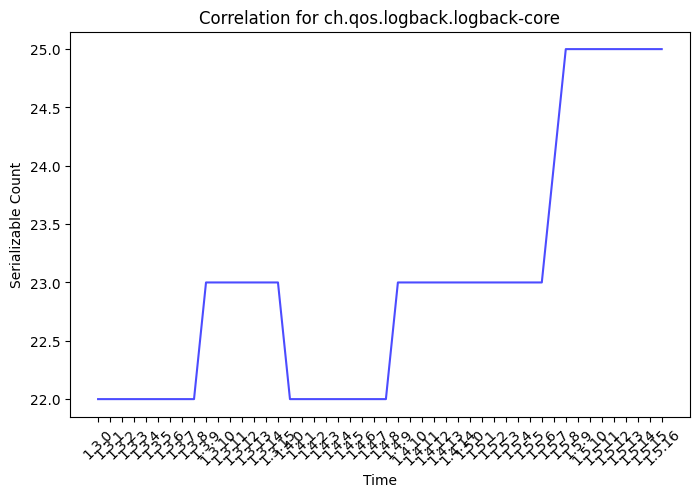

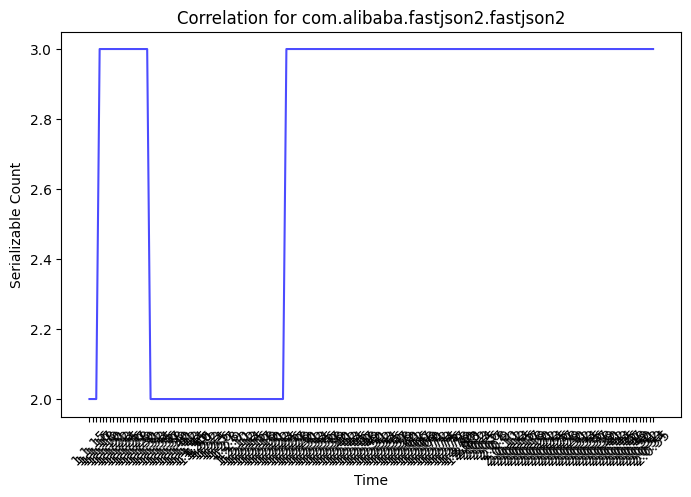

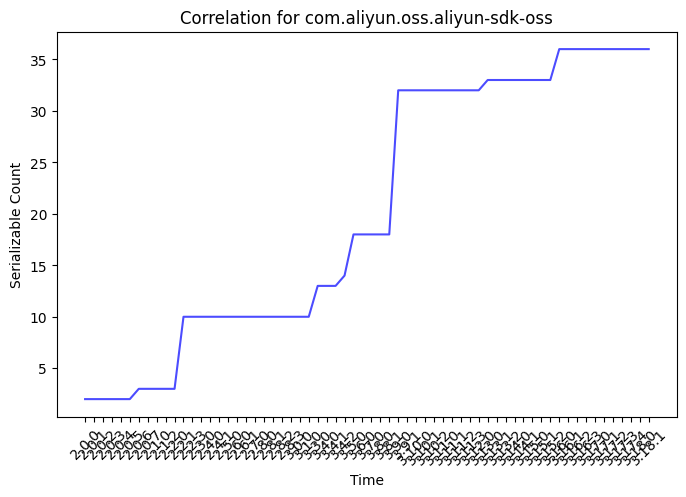

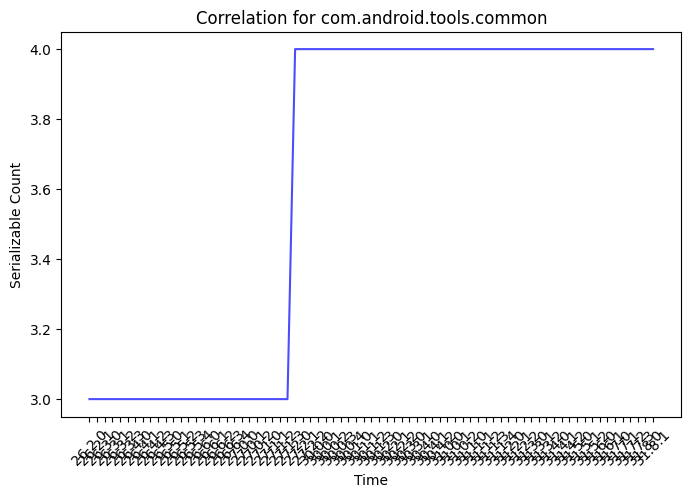

...

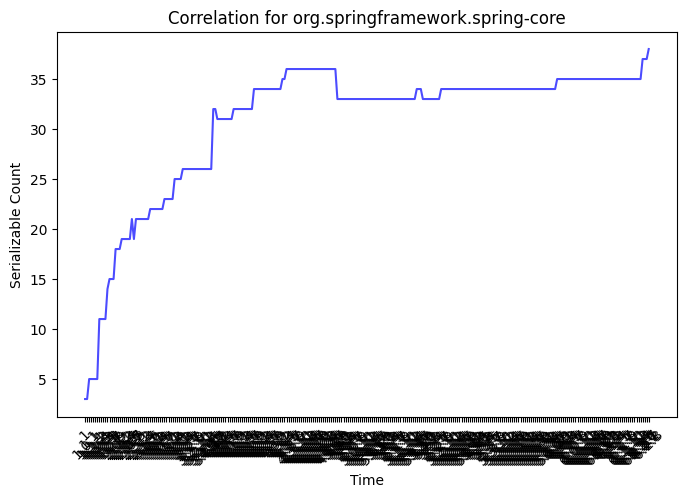

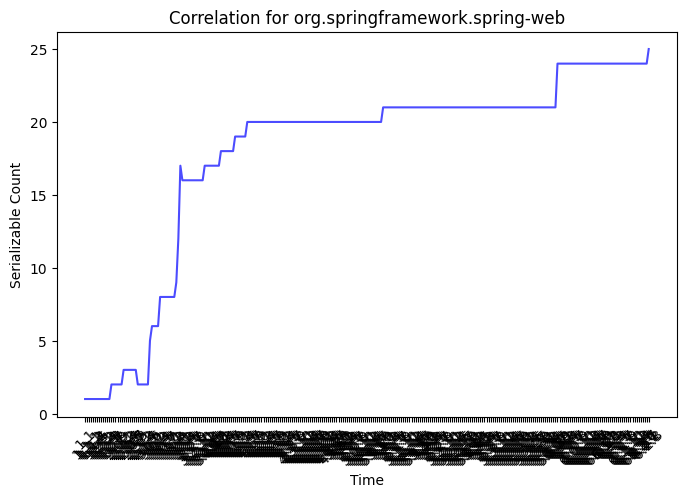

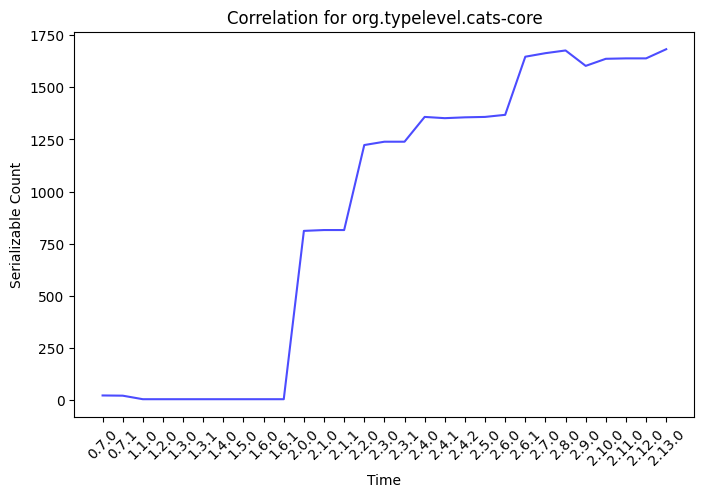

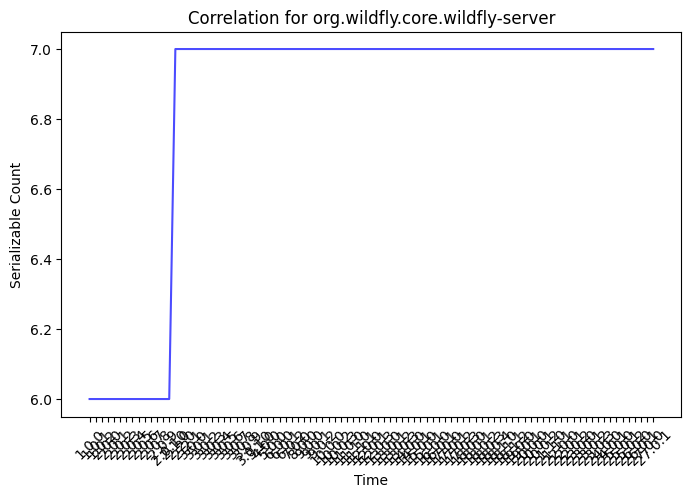

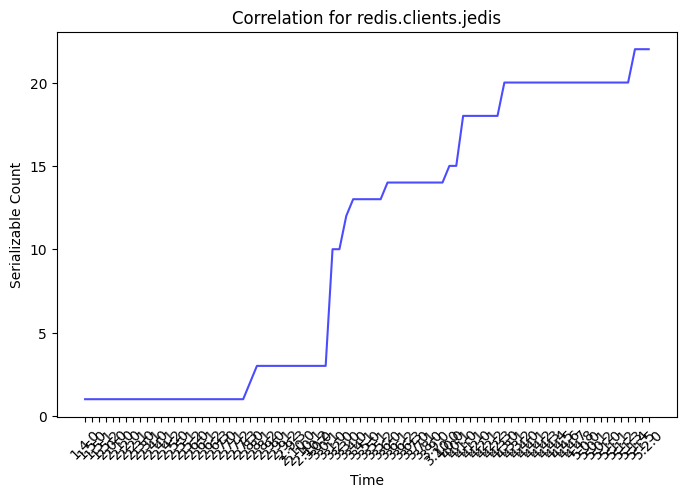

In [13]:
def plot_dependency_correlation(dependency_name, axis):
    df_filtered = df[df['dependency_name'] == dependency_name]

    if df_filtered.empty:
        print(f"No data available for {dependency_name}")
        return

    plt.figure(figsize=(8, 5))
    plt.plot(df_filtered[axis], df_filtered['serializable_cnt'], alpha=0.7, color='b')    
    plt.xlabel("Time")
    plt.ylabel("Serializable Count")
    plt.title(f"Correlation for {dependency_name}")
    plt.xticks(rotation=45)
    plt.show()

for dependency in correlations_version[correlations_version > 0.5].groupby("dependency_name").count().index.tolist():
    plot_dependency_correlation(dependency, 'version')
    

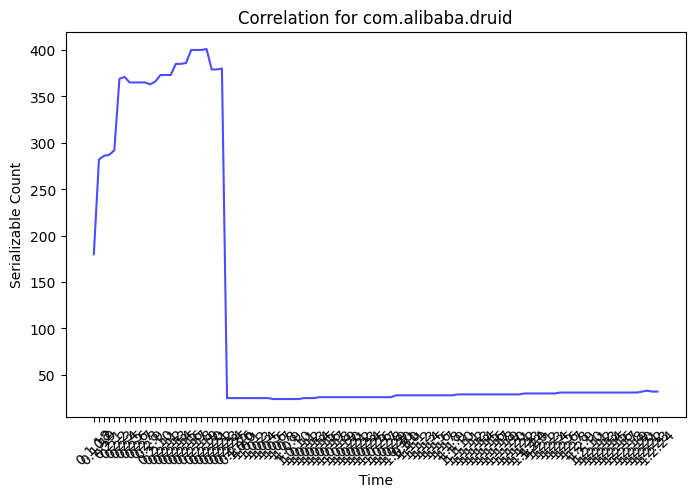

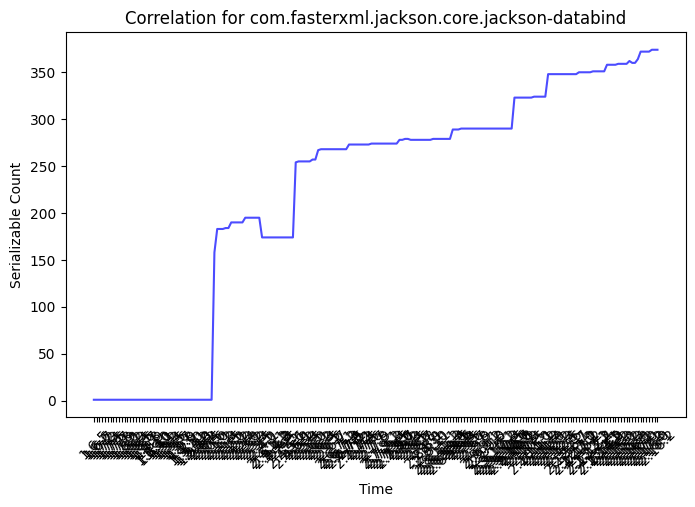

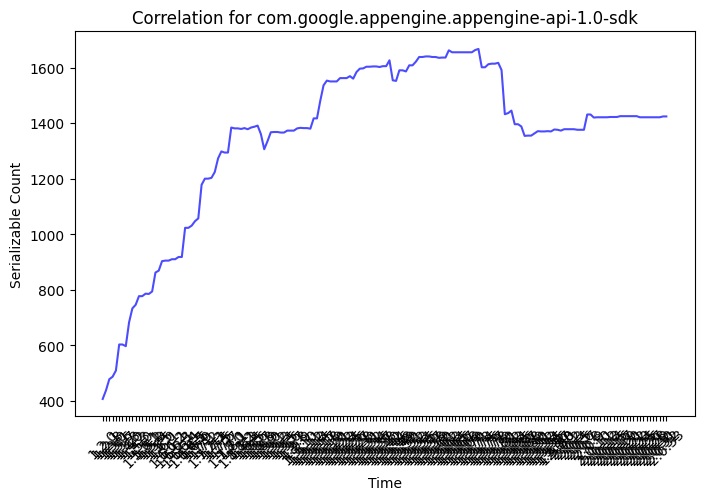

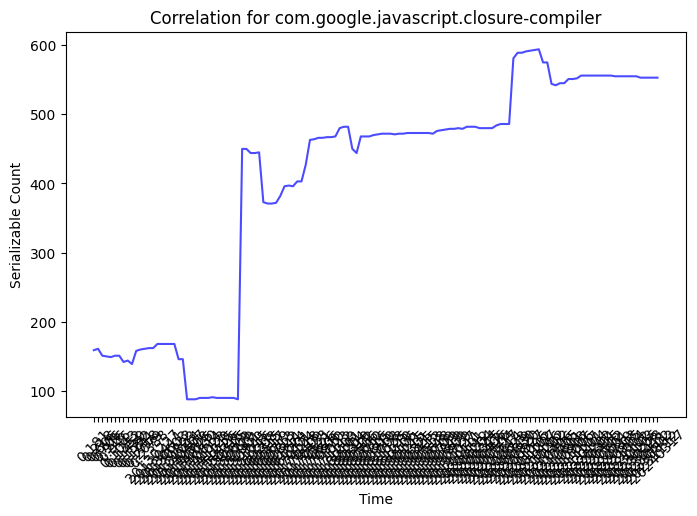

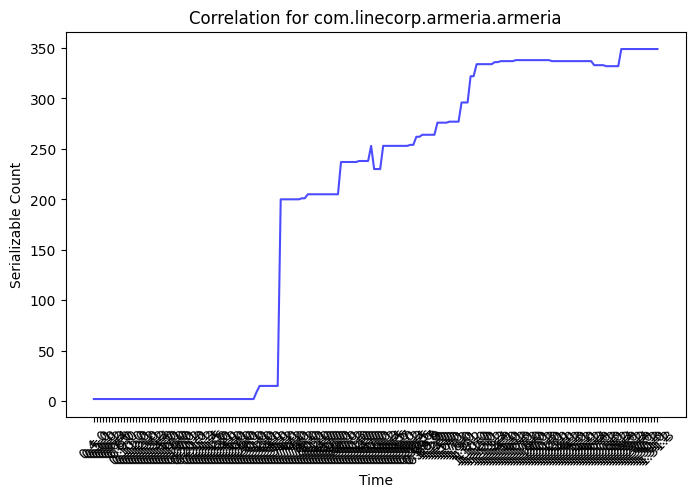

...

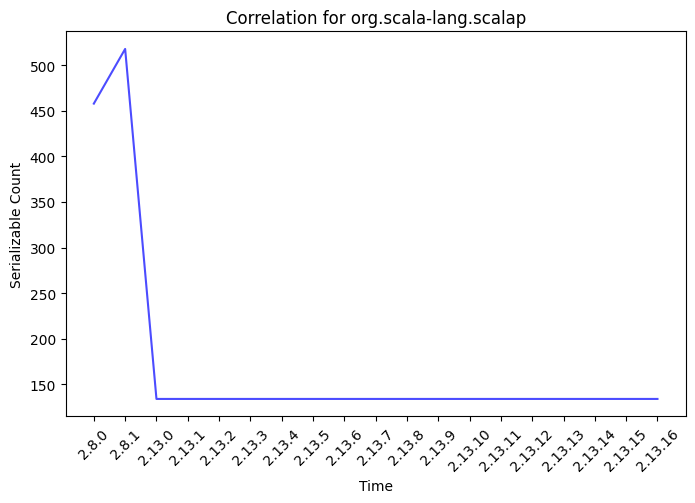

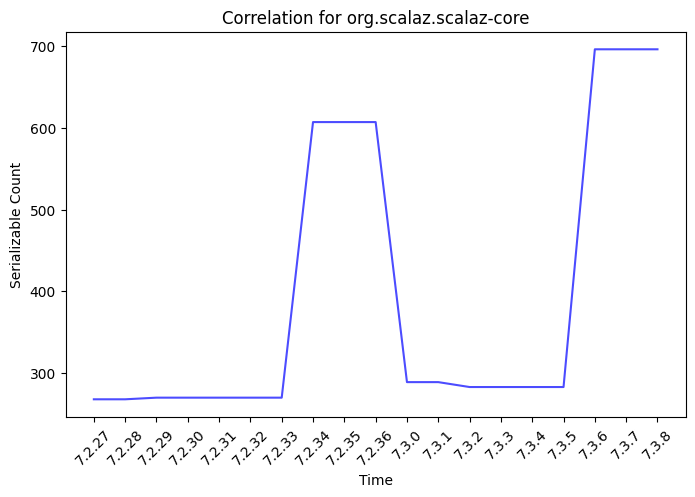

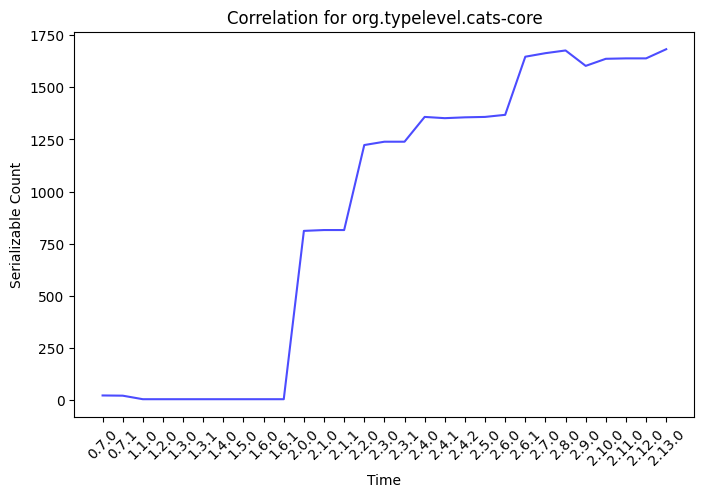

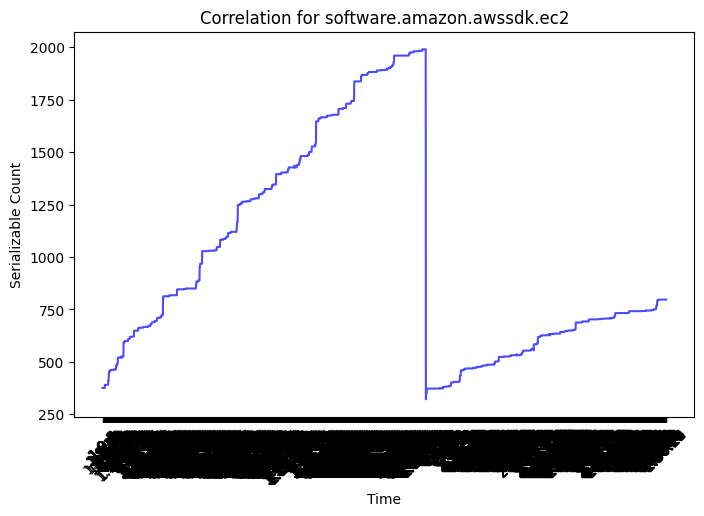

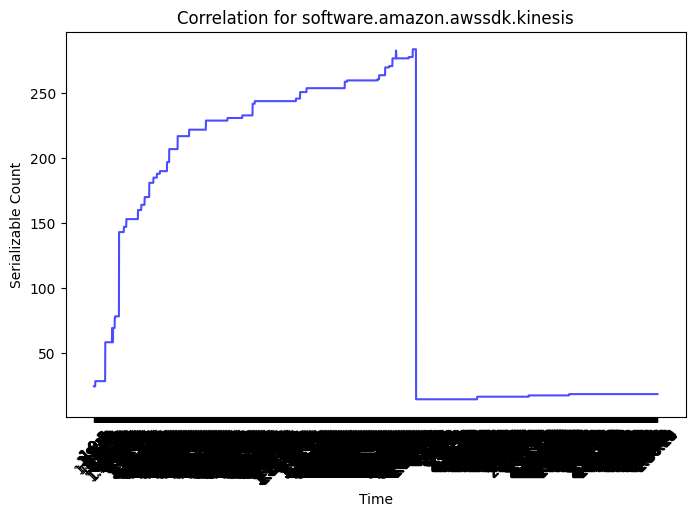

In [14]:
for dependency in variance[variance > 100].index.tolist():
    plot_dependency_correlation(dependency, 'version')

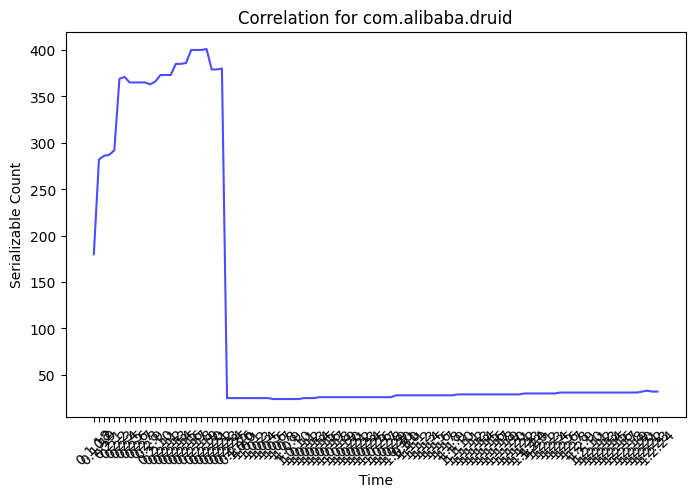

In [15]:
plot_dependency_correlation("com.alibaba.druid", 'version')

                                                Unnamed: 0  version  \
dependency_name                                                       
biz.aQute.bnd.biz.aQute.bndlib                          28       28   
com.alibaba.druid                                       69       69   
com.alibaba.fastjson2.fastjson2                        129      129   
com.aliyun.oss.aliyun-sdk-oss                           63       63   
com.fasterxml.jackson.core.jackson-annotations          94       94   
...                                                    ...      ...   
software.amazon.awssdk.kinesis                        3344     3344   
software.amazon.awssdk.kms                            3344     3344   
software.amazon.awssdk.lambda                         3334     3334   
software.amazon.awssdk.s3                             3343     3343   
software.amazon.awssdk.sqs                            3343     3343   

                                                parsed_date  download_url  \

C:\Users\brunok\AppData\Local\Temp\ipykernel_24472\1597630908.py:23: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_valid_sampled = df_valid.groupby('dependency_name').apply(random_sample_for_each_year).reset_index(drop=True)


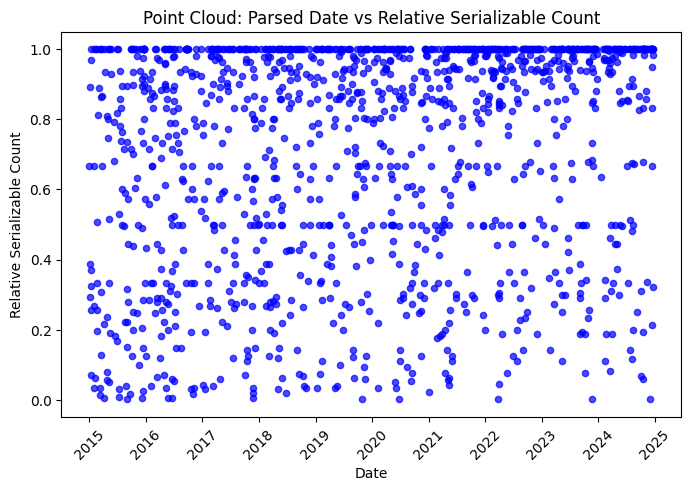

In [16]:
# Step 1: Calculate the relative serializability (serializable_cnt / max(serializable_cnt) within dependency_name)
df['max_serializable_cnt'] = df.groupby('dependency_name')['serializable_cnt'].transform('max')
df['relative_serializable_cnt'] = df['serializable_cnt'] / df['max_serializable_cnt']


# Function to check if a dependency has data for every year in 2015-2024
def has_data_for_all_years(frame):
    years = frame['parsed_date'].dt.year.unique()
    return set(range(2015, 2025)).issubset(years)

# Group by dependency_name and filter out those with missing years
valid_dependencies = df.groupby('dependency_name').filter(has_data_for_all_years)['dependency_name'].unique()

def random_sample_for_each_year(frame):
    return frame.groupby(frame['parsed_date'].dt.year).apply(lambda x: x.sample(1)).reset_index(drop=True)

# Filter the dataframe to only include valid dependencies
df_valid = df[df['dependency_name'].isin(valid_dependencies)]
df_valid = df_valid[df_valid['parsed_date'].dt.year.between(2015, 2024)]
print(df_valid.groupby("dependency_name").count())

# Apply the random sampling per year
df_valid_sampled = df_valid.groupby('dependency_name').apply(random_sample_for_each_year).reset_index(drop=True)

# Step 4: Render the point cloud (parsed_date vs relative_serializable_cnt)
plt.figure(figsize=(8, 5))
plt.scatter(df_valid_sampled['parsed_date'], df_valid_sampled['relative_serializable_cnt'], alpha=0.7, color='b', s=20)

# Labels and title
plt.xlabel("Date")
plt.ylabel("Relative Serializable Count")
plt.title("Point Cloud: Parsed Date vs Relative Serializable Count")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.show()

In [17]:
correlation = 0
for i in range(0,100):
    df_valid_sampled = df_valid.groupby('dependency_name').apply(random_sample_for_each_year).reset_index(drop=True)
    correlation += df_valid_sampled['relative_serializable_cnt'].corr(df_valid_sampled['days_since_start'])

print(correlation / 100)
print(df_valid_sampled.groupby("dependency_name").count())

C:\Users\brunok\AppData\Local\Temp\ipykernel_24472\3002113489.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_valid_sampled = df_valid.groupby('dependency_name').apply(random_sample_for_each_year).reset_index(drop=True)
C:\Users\brunok\AppData\Local\Temp\ipykernel_24472\3002113489.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_valid_sampled = df_valid.groupby('dependency_name').apply(random_s

0.19254778692819363
                                                Unnamed: 0  version  \
dependency_name                                                       
biz.aQute.bnd.biz.aQute.bndlib                          10       10   
com.alibaba.druid                                       10       10   
com.alibaba.fastjson2.fastjson2                         10       10   
com.aliyun.oss.aliyun-sdk-oss                           10       10   
com.fasterxml.jackson.core.jackson-annotations          10       10   
...                                                    ...      ...   
software.amazon.awssdk.kinesis                          10       10   
software.amazon.awssdk.kms                              10       10   
software.amazon.awssdk.lambda                           10       10   
software.amazon.awssdk.s3                               10       10   
software.amazon.awssdk.sqs                              10       10   

                                                parsed_d

C:\Users\brunok\AppData\Local\Temp\ipykernel_24472\3002113489.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_valid_sampled = df_valid.groupby('dependency_name').apply(random_sample_for_each_year).reset_index(drop=True)


In [18]:
dump = df_valid_sampled[['days_since_start', 'relative_serializable_cnt']]
dump.to_csv("correlation.csv", index=False, header=False)